In [1]:
import torch
from torch import nn
from PIL import Image
import numpy as np

In [2]:
class ContractingBlock(nn.Module):
  def __init__(self, input_channels, use_bn=True):
    super(ContractingBlock, self).__init__()
    self.conv1 = nn.Conv2d(input_channels, input_channels*2, kernel_size=3, padding=1)
    self.conv2 = nn.Conv2d(input_channels*2, input_channels*2, kernel_size=3, padding=1)
    self.activation = nn.LeakyReLU(0.2)
    self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
    if use_bn:
      self.batchnorm = nn.BatchNorm2d(input_channels * 2)
    self.use_bn = use_bn

  def forward(self, x):
    x = self.conv1(x)
    if self.use_bn:
      x = self.batchnorm(x)
    x = self.activation(x)
    x = self.conv2(x)
    if self.use_bn:
      x = self.batchnorm(x)
    x = self.activation(x)
    x = self.maxpool(x)
    return x

In [3]:
def crop(image, new_shape):
  cropped_image = image[:,:,int((image.shape[2]-new_shape[2])/2):int((image.shape[2]+new_shape[2])/2),int((image.shape[3]-new_shape[3])/2):int((image.shape[3]+new_shape[3])/2)]
  return cropped_image

In [4]:
class ExpandingBlock(nn.Module):
  def __init__(self, input_channels, use_bn = True):
    super(ExpandingBlock, self).__init__()
    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
    self.conv1 = nn.Conv2d(input_channels, int(input_channels/2), kernel_size=2)
    self.conv2 = nn.Conv2d(input_channels, int(input_channels/2), kernel_size=3, padding=1)
    self.conv3 = nn.Conv2d(int(input_channels/2), int(input_channels/2), kernel_size=2, padding = 1)
    if use_bn:
      self.batchnorm = nn.BatchNorm2d(input_channels // 2)
      self.use_bn = use_bn
    self.activation = nn.ReLU()

  def forward(self, x, skip_con_x):
    x = self.upsample(x)
    x = self.conv1(x)
    skip_con_x = crop(skip_con_x, x.shape)
    x = torch.cat([x, skip_con_x], axis=1)
    x = self.conv2(x)
    if self.use_bn:
      x = self.batchnorm(x)
    x = self.activation(x)
    x = self.conv3(x)
    if self.use_bn:
      x = self.batchnorm(x)
    x = self.activation(x)
    return x

In [ ]:
#@title

test_samples = 1
test_channels = 3
test_size_x = 480
test_size_y = 276

test_data = torch.randn(test_samples, test_channels, test_size_x, test_size_y)
test_block = ContractingBlock(test_channels)
test_block2 = ExpandingBlock(test_channels*2)

print(test_data.shape)
test_output = test_block(test_data)
print(test_block2.upsample(test_output).shape)
test_output2 = test_block2(test_output, test_data)
print(test_output.shape)
print(test_output2.shape)

torch.Size([1, 3, 480, 276])
torch.Size([1, 6, 480, 276])
torch.Size([1, 6, 240, 138])
torch.Size([1, 3, 480, 276])


In [5]:
class FeatureMapBlock(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        x = self.conv(x)
        return x

In [6]:
#likely the pre and post frame will be stacked on the channel dimension

class Generator(nn.Module):
  def __init__(self, input_channels, output_channels, hidden_channels=64):
    super(Generator, self).__init__()
    self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
    self.contract1 = ContractingBlock(hidden_channels)
    self.contract2 = ContractingBlock(hidden_channels * 2)
    self.contract3 = ContractingBlock(hidden_channels * 4)
    self.contract4 = ContractingBlock(hidden_channels * 8)
    self.expand1 = ExpandingBlock(hidden_channels * 16)
    self.expand2 = ExpandingBlock(hidden_channels * 8)
    self.expand3 = ExpandingBlock(hidden_channels * 4)
    self.expand4 = ExpandingBlock(hidden_channels * 2)
    self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
    self.sigmoid = torch.nn.Sigmoid()
  
  def forward(self,x):
    x0 = self.upfeature(x)
    x1 = self.contract1(x0)
    x2 = self.contract2(x1)
    x3 = self.contract3(x2)
    x4 = self.contract4(x3)
    x5 = self.expand1(x4, x3)
    x6 = self.expand2(x5, x2)
    x7 = self.expand3(x6, x1)
    x8 = self.expand4(x7, x0)
    xn = self.downfeature(x8)
    return self.sigmoid(xn)

In [ ]:
#@title
# Height and Width have to be multiples of 16

opgan = Generator(3,3)
print(test_data.shape)
output = opgan(test_data)
print(output.shape)

torch.Size([1, 3, 480, 276])
torch.Size([1, 3, 480, 272])


In [7]:
# Connect Google Drive
from google.colab import drive
drive.mount('/content/gdrive')
print('Google Drive connected.')

Mounted at /content/gdrive
Google Drive connected.


In [8]:
#@markdown ## Input File
Input_File = "CS236G_Project/DAIN_test/test.mkv" #@param{type:"string"}

#@markdown ## Frame Location
Frame_Storage = "CS236G_Project/test_frames" #@param{type:"string"}

#@markdown ## Chunk Location
Chunk_Storage = "CS236G_Project/testing_chunks" #@param{type:"string"}

In [ ]:
%shell ffmpeg -i '/content/gdrive/MyDrive/{Input_File}' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS' '/content/gdrive/MyDrive/{Frame_Storage}/%05d.png'

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
%shell ffmpeg -i '/content/gdrive/MyDrive/CS236G_Project/clips/a.mkv' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS,scale=704:480' '/content/gdrive/MyDrive/CS236G_Project/test_frames/a/%05d.png'
%shell ffmpeg -i '/content/gdrive/MyDrive/CS236G_Project/clips/b.mp4' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS,scale=704:480' '/content/gdrive/MyDrive/CS236G_Project/test_frames/b/%05d.png'
%shell ffmpeg -i '/content/gdrive/MyDrive/CS236G_Project/clips/c1.mkv' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS,scale=704:480' '/content/gdrive/MyDrive/CS236G_Project/test_frames/c1/%05d.png'
%shell ffmpeg -i '/content/gdrive/MyDrive/CS236G_Project/clips/c2.mkv' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS,scale=704:480' '/content/gdrive/MyDrive/CS236G_Project/test_frames/c2/%05d.png'

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
#@title
im = Image.open('/content/gdrive/MyDrive/{}/00001.png'.format(Frame_Storage))
np_im = np.array(im)
print(np_im.shape)

(480, 704, 3)


In [ ]:
#@title
im = Image.open('/content/gdrive/MyDrive/CS236G_Project/test_frames/a/00001.png')
np_im = np.array(im)
print(np_im.shape)

(480, 704, 3)


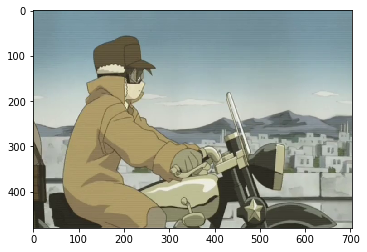

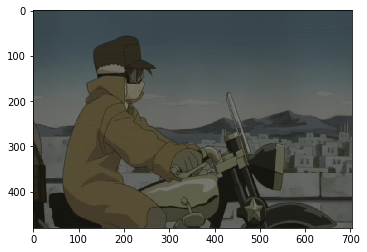

In [ ]:
#@title
from matplotlib import pyplot as plt
plt.imshow(np_im, interpolation='nearest')
plt.show()

new_im = np_im/255
new_im = new_im/2
plt.imshow(new_im, interpolation='nearest')
plt.show()

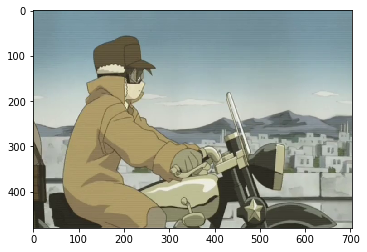

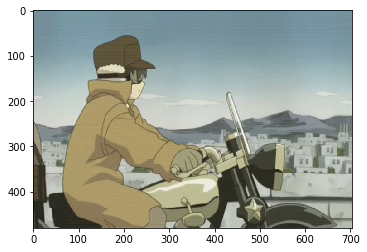

In [ ]:
#@title
before_frame = Image.open('/content/gdrive/MyDrive/{}/00001.png'.format(Frame_Storage))
after_frame = Image.open('/content/gdrive/MyDrive/{}/00003.png'.format(Frame_Storage))
before_array = np.array(before_frame)/255
after_array = np.array(after_frame)/255

plt.imshow(before_array, interpolation='nearest')
plt.show()
plt.imshow(after_array, interpolation='nearest')
plt.show()

#test_input = np.concat(before_array)
ba = np.transpose(before_array, (2, 0, 1))
aa = np.transpose(after_array, (2, 0, 1))



In [ ]:
#@title
test_input = np.expand_dims(np.concatenate((ba, aa), axis = 0), axis = 0)
print(test_input.shape)
test_opgan = Generator(6,3)
test_opgan.float()
test_input = torch.from_numpy(test_input).float()
print(test_input.dtype)
test_output = test_opgan(test_input)

(1, 6, 480, 704)
torch.float32


torch.Size([1, 3, 480, 704])
(480, 704, 3)


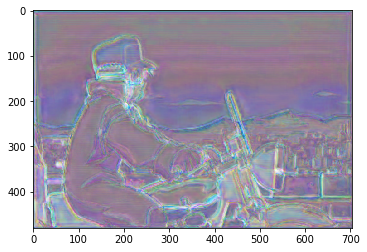

In [ ]:
#@title
print(test_output.shape)
image = np.transpose(np.array(torch.squeeze(test_output).detach()), (1,2,0))
print(image.shape)
plt.imshow(image, interpolation='nearest')
plt.show()

In [9]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake. 
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        #### START CODE HERE ####
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)
        #### END CODE HERE ####

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [10]:
import torch.nn.functional as F
# New parameters
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 2
input_dim = 6
real_dim = 3
display_step = 500
batch_size = 1
lr = 0.0002
target_shape = 256
device = 'cuda'

In [11]:
gen = Generator(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [12]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [13]:
pretrained = True
if pretrained:
    loaded_state = torch.load("/content/gdrive/MyDrive/CS236G_Project/opgan2_14000.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)
    disc = disc.apply(weights_init)

In [14]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator; takes the condition and returns potential images
        disc: the discriminator; takes images and the condition and
          returns real/fake prediction matrices
        real: the real images (e.g. maps) to be used to evaluate the reconstruction
        condition: the source images (e.g. satellite imagery) which are used to produce the real images
        adv_criterion: the adversarial loss function; takes the discriminator 
                  predictions and the true labels and returns a adversarial 
                  loss (which you aim to minimize)
        recon_criterion: the reconstruction loss function; takes the generator 
                    outputs and the real images and returns a reconstructuion 
                    loss (which you aim to minimize)
        lambda_recon: the degree to which the reconstruction loss should be weighted in the sum
    '''
    # Steps: 1) Generate the fake images, based on the conditions.
    #        2) Evaluate the fake images and the condition with the discriminator.
    #        3) Calculate the adversarial and reconstruction losses.
    #        4) Add the two losses, weighting the reconstruction loss appropriately.
    #### START CODE HERE ####
    fake = gen(condition)
    disc_label = disc(fake, condition)
    adv_loss = adv_criterion(disc_label, torch.ones_like(disc_label))
    recon_loss = recon_criterion(fake, real)
    gen_loss = adv_loss + lambda_recon * recon_loss
    
    #### END CODE HERE ####
    return gen_loss

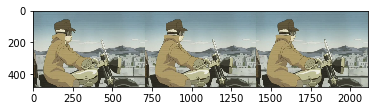

In [ ]:
image_index = 1
a_name = '/content/gdrive/MyDrive/{}/{}.png'.format(Frame_Storage, f'{image_index:05}')
b_name = '/content/gdrive/MyDrive/{}/{}.png'.format(Frame_Storage, f'{(image_index + 1):05}')
c_name = '/content/gdrive/MyDrive/{}/{}.png'.format(Frame_Storage, f'{(image_index + 2):05}')
# print(a_name)
a = np.array(Image.open(a_name))/255
b = np.array(Image.open(b_name))/255
c = np.array(Image.open(c_name))/255
chunk = np.concatenate((a,c,b), axis = 1)
plt.imshow(chunk, interpolation='nearest')

In [ ]:
chunk_im = Image.fromarray((chunk * 255).astype(np.uint8))
chunk_im.save('/content/gdrive/MyDrive/{}/{}.png'.format(Chunk_Storage, f'{image_index:05}'))

In [5]:
def image2chunk(folder,image_index, frame_gap = 1):
  a_name = '/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{image_index:05}')
  b_name = '/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{(image_index + frame_gap):05}')
  c_name = '/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{(image_index + 2*frame_gap):05}')
  # print(a_name)
  a = np.array(Image.open(a_name))/255
  b = np.array(Image.open(b_name))/255
  c = np.array(Image.open(c_name))/255
  chunk = np.concatenate((a,c,b), axis = 1)
  chunk_im = Image.fromarray((chunk * 255).astype(np.uint8))
  chunk_im.save('/content/gdrive/MyDrive/{}/{}/{}.png'.format(Chunk_Storage, folder, f'{image_index:05}'))

In [ ]:
#@title

for i in range(2, 300):
  image2chunk(i)

In [ ]:
frame_gap = 1
import glob as glob
folders = ['a', 'b', 'c1', 'c2']

for folder in folders:
  frame_count = len(list(glob.iglob("/content/gdrive/MyDrive/{}/{}/*.png".format(Frame_Storage, folder))))
  todo = frame_count - 2*frame_gap
  print("Commencing on frame folder {}".format(folder))
  for i in range(1, todo+1):
    image2chunk(folder, i, frame_gap)
    if i%50 == 0:
      print("Processed {} out of {} on todo list".format(i, todo))
  print("Finished on frame folder {}".format(folder))

Commencing on frame folder a
Processed 50 out of 1844 on todo list
Processed 100 out of 1844 on todo list
Processed 150 out of 1844 on todo list
Processed 200 out of 1844 on todo list
Processed 250 out of 1844 on todo list
Processed 300 out of 1844 on todo list
Processed 350 out of 1844 on todo list
Processed 400 out of 1844 on todo list
Processed 450 out of 1844 on todo list
Processed 500 out of 1844 on todo list
Processed 550 out of 1844 on todo list
Processed 600 out of 1844 on todo list
Processed 650 out of 1844 on todo list
Processed 700 out of 1844 on todo list
Processed 750 out of 1844 on todo list
Processed 800 out of 1844 on todo list
Processed 850 out of 1844 on todo list
Processed 900 out of 1844 on todo list
Processed 950 out of 1844 on todo list
Processed 1000 out of 1844 on todo list
Processed 1050 out of 1844 on todo list
Processed 1100 out of 1844 on todo list
Processed 1150 out of 1844 on todo list
Processed 1200 out of 1844 on todo list
Processed 1250 out of 1844 on t

Test out the dataloader

In [15]:
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [18]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [16]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

import torchvision
dataset = torchvision.datasets.ImageFolder('/content/gdrive/MyDrive/{}'.format(Chunk_Storage), transform=transform)

In [19]:
dataset_len = len(dataset)
print(dataset_len)

2107


In [ ]:
print(dataset_len//5)

1789


In [ ]:
dataset_len = len(dataset)

train_dataset, val_dataset = torch.utils.data.random_split(dataset, [dataset_len - dataset_len//5, dataset_len//5])

In [ ]:
# dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [ ]:
for image, _ in tqdm(dataloader):
  print(image.shape)

torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])
torch.Size([1, 3, 480, 2112])


KeyboardInterrupt: ignored

In [ ]:
print(image.shape)

torch.Size([4, 3, 480, 2112])


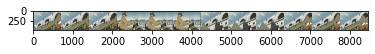

In [ ]:
show_tensor_images(image, num_images=4, size=(3, 480, 2112))

In [ ]:
image_width = image.shape[3]
pre = image[:, :, :, :image_width // 3]
post = image[:, :, :, image_width // 3:2*image_width // 3]
condition = torch.cat((pre, post), dim=1)
real = image[:, :, :, 2*image_width // 3:]
condition = condition.to(device)
real = real.to(device)

In [ ]:
print(condition.shape)
print(real.shape)

torch.Size([1, 6, 480, 704])
torch.Size([1, 3, 480, 704])


In [ ]:
cur_batch_size = len(condition)
print(cur_batch_size)

4


In [ ]:
fake = gen(condition)

RuntimeError: ignored

In [ ]:
print(fake.shape)

torch.Size([4, 3, 480, 704])


In [ ]:
print(real)

tensor([[[[0.8275, 0.8118, 0.8235,  ..., 0.8627, 0.8824, 0.8667],
          [0.8275, 0.8118, 0.8235,  ..., 0.8627, 0.8824, 0.8667],
          [0.8275, 0.8118, 0.8235,  ..., 0.8667, 0.8824, 0.8667],
          ...,
          [0.8667, 0.8667, 0.8549,  ..., 0.1725, 0.1686, 0.1686],
          [0.8078, 0.8078, 0.7961,  ..., 0.1608, 0.1608, 0.1608],
          [0.7294, 0.7294, 0.7176,  ..., 0.1608, 0.1608, 0.1608]],

         [[0.8510, 0.8353, 0.8471,  ..., 0.8745, 0.8941, 0.8784],
          [0.8510, 0.8353, 0.8471,  ..., 0.8745, 0.8941, 0.8784],
          [0.8510, 0.8353, 0.8471,  ..., 0.8784, 0.8941, 0.8784],
          ...,
          [0.8706, 0.8706, 0.8588,  ..., 0.1686, 0.1686, 0.1686],
          [0.8118, 0.8118, 0.8000,  ..., 0.1608, 0.1608, 0.1608],
          [0.7333, 0.7333, 0.7216,  ..., 0.1608, 0.1608, 0.1608]],

         [[0.8157, 0.8000, 0.8118,  ..., 0.8431, 0.8627, 0.8471],
          [0.8157, 0.8000, 0.8118,  ..., 0.8431, 0.8627, 0.8471],
          [0.8157, 0.8000, 0.8118,  ..., 0

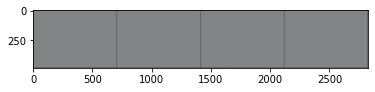

In [ ]:
show_tensor_images(fake, num_images=4, size=(3, 480, 704))

#surprisingly grey, I was expecting more

In [ ]:
disc_fake_hat = disc(fake.detach(), condition) # Detach generator
disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
disc_real_hat = disc(real, condition)
disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
disc_loss = (disc_fake_loss + disc_real_loss) / 2

RuntimeError: ignored

Pretrained initial state


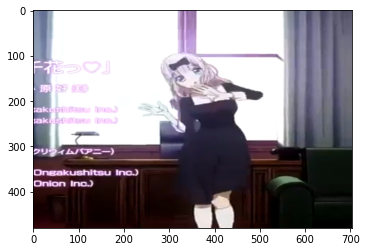

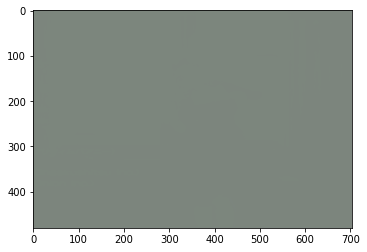

Validation Set Gen Loss: 69.19598880767819, Validation Set Disc Loss: 0.6937261015176772
Epoch 0: Step 500: Generator (U-Net) loss: 59.74296968460088, Discriminator loss: 0.5866265745162964


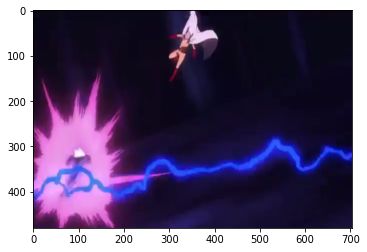

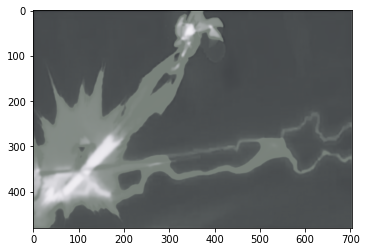

Validation Set Gen Loss: 43.68718029022216, Validation Set Disc Loss: 0.4781456658244135
Epoch 0: Step 1000: Generator (U-Net) loss: 36.781609060287444, Discriminator loss: 0.566461046338081


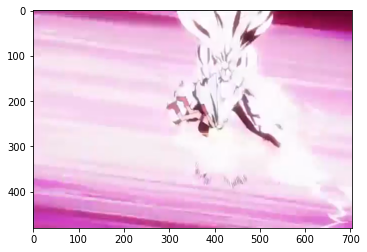

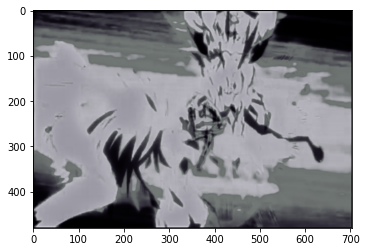

Validation Set Gen Loss: 30.98632501602174, Validation Set Disc Loss: 0.6101043537259097
Epoch 0: Step 1500: Generator (U-Net) loss: 29.813356536865214, Discriminator loss: 0.5655199546813967


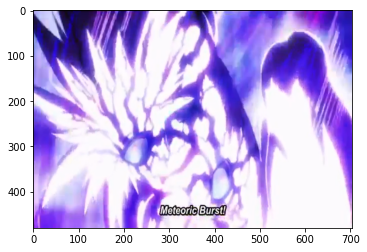

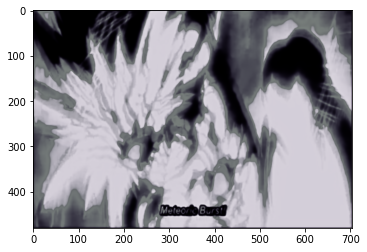

Validation Set Gen Loss: 27.32345681190491, Validation Set Disc Loss: 0.541250391602516
Epoch 0: Step 2000: Generator (U-Net) loss: 27.011296607971197, Discriminator loss: 0.529732960164547


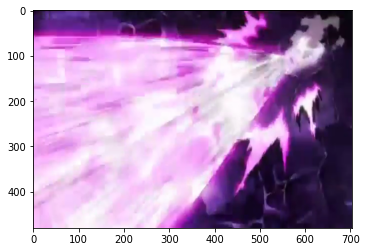

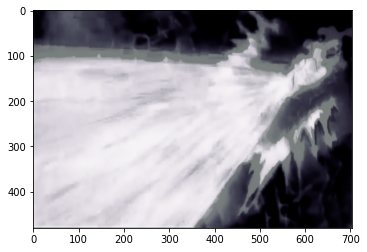

Validation Set Gen Loss: 26.307920351028443, Validation Set Disc Loss: 0.582295535504818
Epoch 0: Step 2500: Generator (U-Net) loss: 25.187607163429263, Discriminator loss: 0.5485296830236902


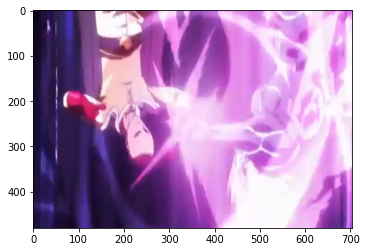

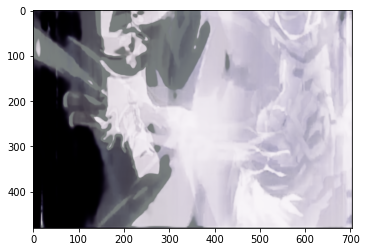

Validation Set Gen Loss: 25.689930729866045, Validation Set Disc Loss: 0.6225926119089126
Epoch 0: Step 3000: Generator (U-Net) loss: 23.586196259498593, Discriminator loss: 0.5756023317873484


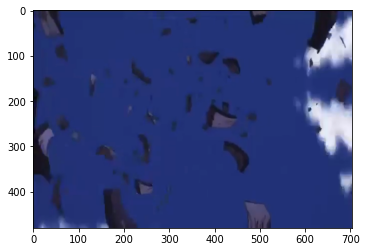

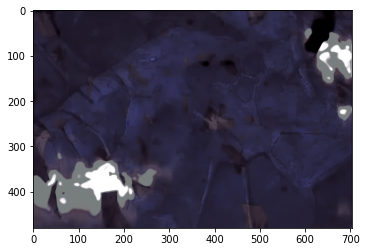

Validation Set Gen Loss: 22.396951026916497, Validation Set Disc Loss: 0.5075848349928855
Epoch 0: Step 3500: Generator (U-Net) loss: 22.40858808326722, Discriminator loss: 0.5793485848605632


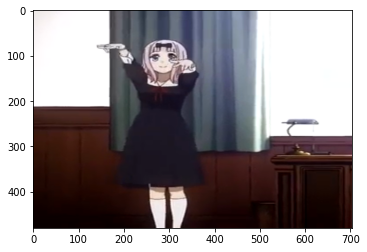

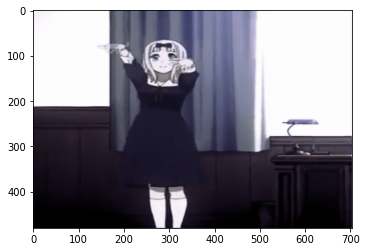

Validation Set Gen Loss: 23.034347553253177, Validation Set Disc Loss: 0.5589107342064384
Epoch 0: Step 4000: Generator (U-Net) loss: 23.92610320949554, Discriminator loss: 0.5845077030956745


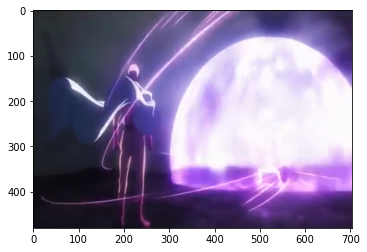

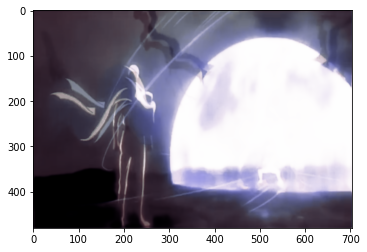

Validation Set Gen Loss: 21.20517329216003, Validation Set Disc Loss: 0.5571311974525451
Epoch 0: Step 4500: Generator (U-Net) loss: 22.55905170249939, Discriminator loss: 0.564714004725218


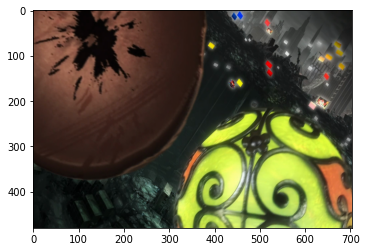

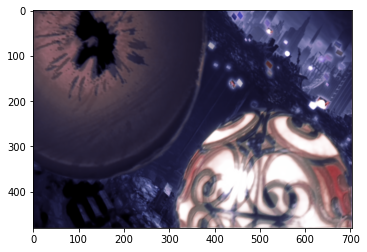

Validation Set Gen Loss: 22.427625136375433, Validation Set Disc Loss: 0.5451990973949429
Epoch 0: Step 5000: Generator (U-Net) loss: 21.676625411987324, Discriminator loss: 0.5567358584702015


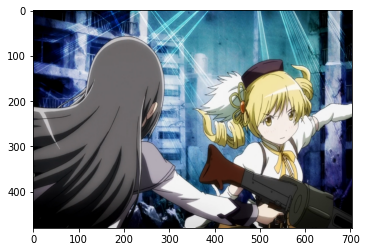

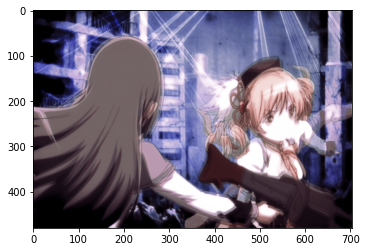

Validation Set Gen Loss: 19.82560552597046, Validation Set Disc Loss: 0.5627590592205528
Epoch 0: Step 5500: Generator (U-Net) loss: 20.77391222286224, Discriminator loss: 0.5072861232757568


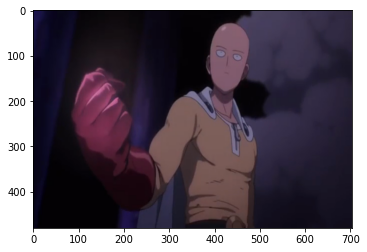

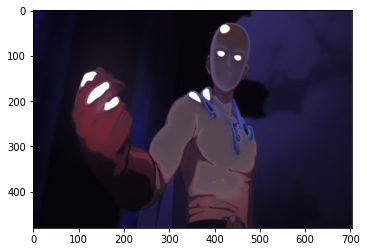

Validation Set Gen Loss: 20.645480103492737, Validation Set Disc Loss: 0.5199928763508797
Epoch 0: Step 6000: Generator (U-Net) loss: 20.947671330451975, Discriminator loss: 0.4977761641144751


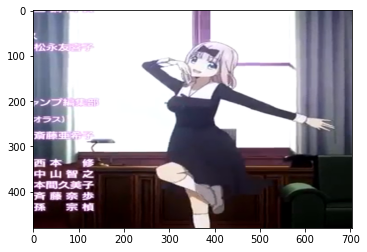

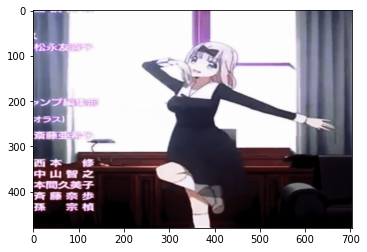

Validation Set Gen Loss: 20.49493231773377, Validation Set Disc Loss: 0.4920801977813244
Epoch 0: Step 6500: Generator (U-Net) loss: 20.312665738105792, Discriminator loss: 0.49117732182145135


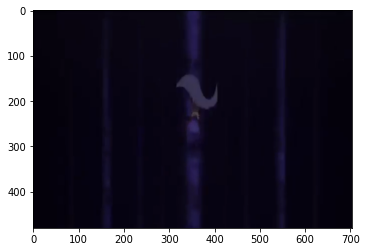

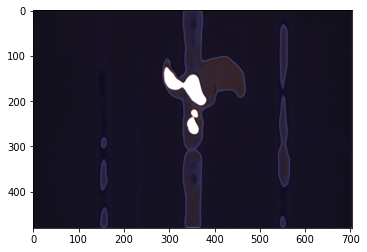

Validation Set Gen Loss: 21.079504380226126, Validation Set Disc Loss: 0.4961207287013531
Epoch 0: Step 7000: Generator (U-Net) loss: 21.67391565513611, Discriminator loss: 0.44325224605202673


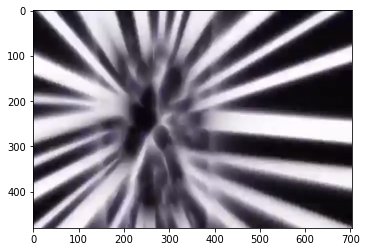

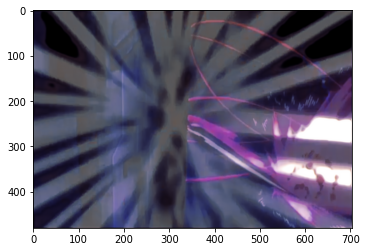

Validation Set Gen Loss: 19.363456897735595, Validation Set Disc Loss: 0.4788062278181314



Epoch 1: Step 7500: Generator (U-Net) loss: 19.925996093750005, Discriminator loss: 0.45577264618873586


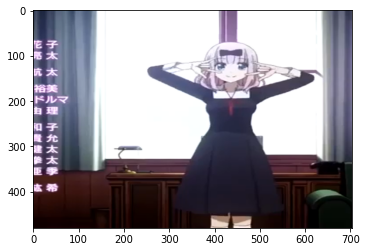

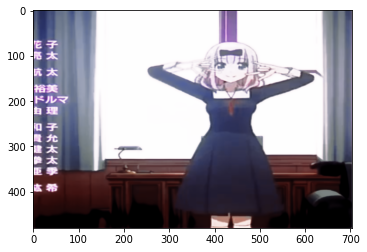

Validation Set Gen Loss: 17.498033580780035, Validation Set Disc Loss: 0.47745084553956985
Epoch 1: Step 8000: Generator (U-Net) loss: 21.313727600097643, Discriminator loss: 0.4423060567826036


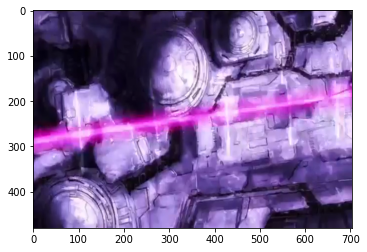

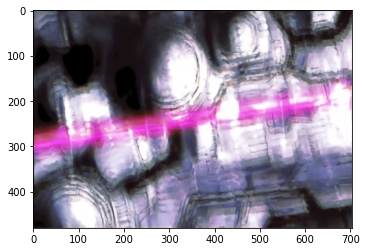

Validation Set Gen Loss: 19.537192087173462, Validation Set Disc Loss: 0.4759703274071215
Epoch 1: Step 8500: Generator (U-Net) loss: 19.973795054435733, Discriminator loss: 0.42558758898079413


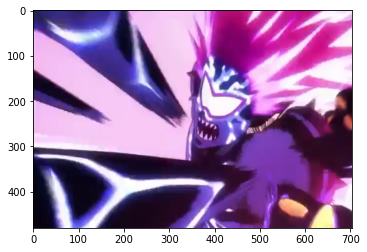

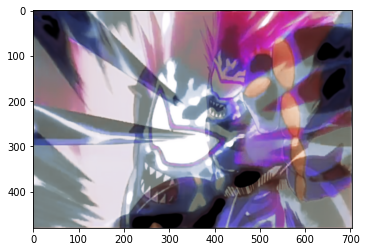

Validation Set Gen Loss: 16.90499366283417, Validation Set Disc Loss: 0.4661198443174362
Epoch 1: Step 9000: Generator (U-Net) loss: 19.835780614852908, Discriminator loss: 0.43548412290215494


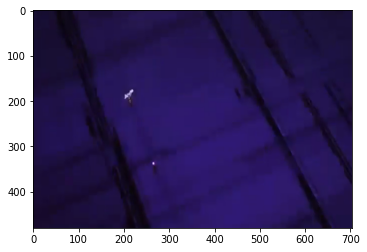

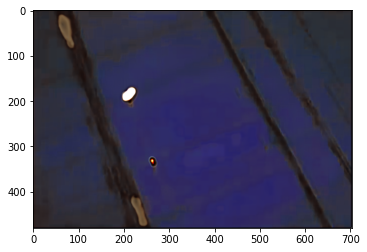

Validation Set Gen Loss: 17.168608717918396, Validation Set Disc Loss: 0.4280753581225871
Epoch 1: Step 9500: Generator (U-Net) loss: 19.302600295066817, Discriminator loss: 0.4078577583134173


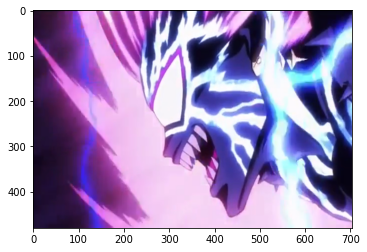

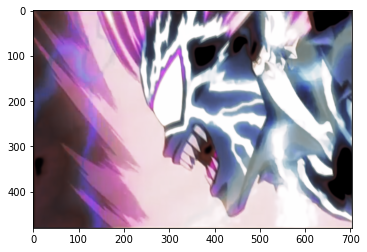

Validation Set Gen Loss: 18.880703830719, Validation Set Disc Loss: 0.3784536408632994
Epoch 1: Step 10000: Generator (U-Net) loss: 20.009588258743282, Discriminator loss: 0.3580546464100478


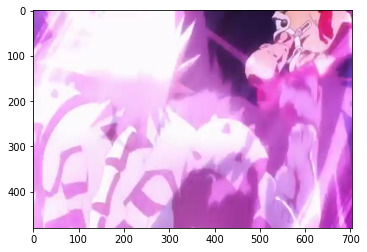

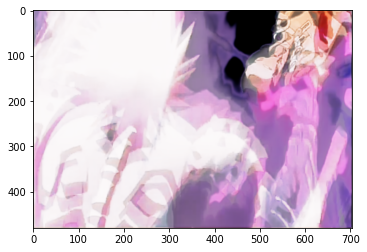

Validation Set Gen Loss: 20.41464695930481, Validation Set Disc Loss: 0.5425078774988651
Epoch 1: Step 10500: Generator (U-Net) loss: 19.60288526344298, Discriminator loss: 0.332258127875626


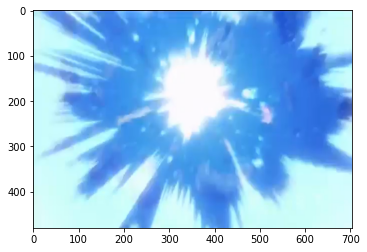

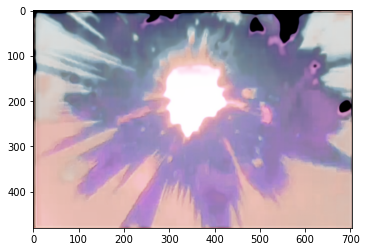

Validation Set Gen Loss: 16.992472653388976, Validation Set Disc Loss: 0.20843325085937967
Epoch 1: Step 11000: Generator (U-Net) loss: 19.618168235778807, Discriminator loss: 0.3113108636811377


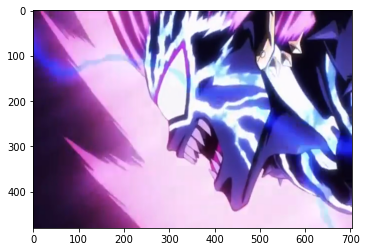

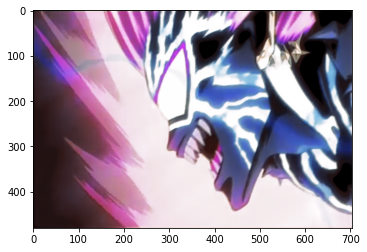

Validation Set Gen Loss: 18.062459492683416, Validation Set Disc Loss: 0.4046016013994814
Epoch 1: Step 11500: Generator (U-Net) loss: 18.941274097442633, Discriminator loss: 0.30173638388142004


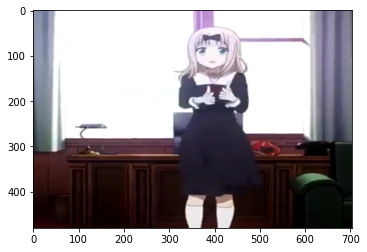

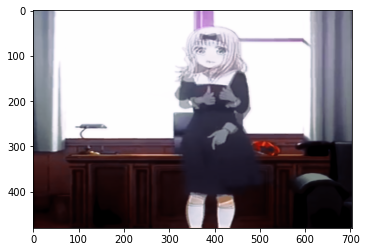

Validation Set Gen Loss: 19.24873184204102, Validation Set Disc Loss: 0.24327075470238926
Epoch 1: Step 12000: Generator (U-Net) loss: 20.90678543663026, Discriminator loss: 0.2838560762591658


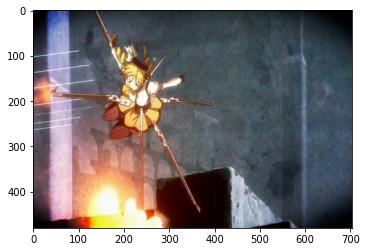

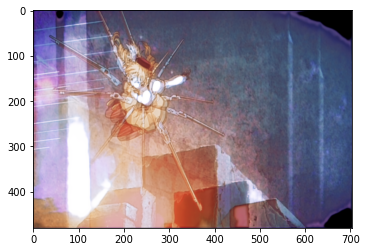

Validation Set Gen Loss: 18.339334788322443, Validation Set Disc Loss: 0.3012321732565761
Epoch 1: Step 12500: Generator (U-Net) loss: 20.550970101833343, Discriminator loss: 0.25948723846673966


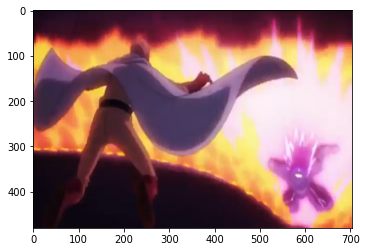

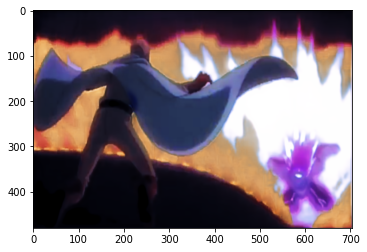

Validation Set Gen Loss: 21.682345447540282, Validation Set Disc Loss: 0.27717914851382375
Epoch 1: Step 13000: Generator (U-Net) loss: 19.786183800697348, Discriminator loss: 0.313392312575132


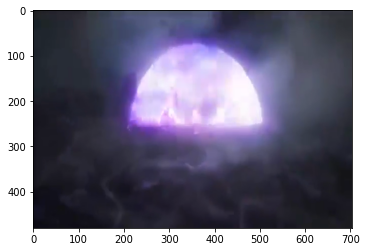

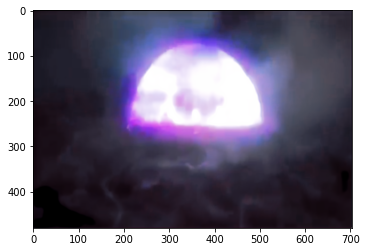

Validation Set Gen Loss: 21.557730584144597, Validation Set Disc Loss: 0.2519539091736078
Epoch 1: Step 13500: Generator (U-Net) loss: 20.10806581401825, Discriminator loss: 0.30055598846822956


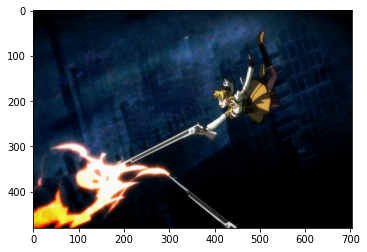

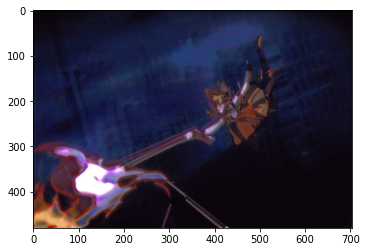

Validation Set Gen Loss: 19.406127085685732, Validation Set Disc Loss: 0.38710162824019784
Epoch 1: Step 14000: Generator (U-Net) loss: 20.083621827125533, Discriminator loss: 0.3140388346500693


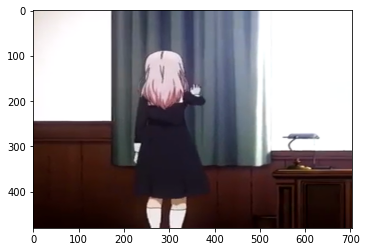

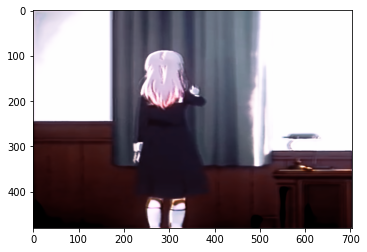

Validation Set Gen Loss: 17.768180766105644, Validation Set Disc Loss: 0.2953229066729545



In [ ]:
# TO IMPLEMENT

# LOOKS LIKE THE PROVIDED IMAGES ARE ACTUALLY STUCK TOGETHER
# AND THE CONDITION AND REAL ARE GOTTEN FROM PICKING OUT PARTS OF THE IMAGE
# WE CAN PREPROCESS TO STICK THE IMAGES TOGETHER

from skimage import color
import numpy as np
train_gen = []
train_disc = []
val_gen = []
val_disc = []
def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0
    val_count_limit = 100

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for image, _ in tqdm(train_dataloader):
            #image_width = image.shape[3]
            #condition = image[:, :, :, :image_width // 2]
            #condition = nn.functional.interpolate(condition, size=target_shape)
            #real = image[:, :, :, image_width // 2:]
            #real = nn.functional.interpolate(real, size=target_shape)

            image_width = image.shape[3]
            pre = image[:, :, :, :image_width // 3]
            post = image[:, :, :, image_width // 3:2*image_width // 3]
            condition = torch.cat((pre, post), dim=1)
            real = image[:, :, :, 2*image_width // 3:]

            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                    train_gen.append(mean_generator_loss)
                    train_disc.append(mean_discriminator_loss)
                else:
                    print("Pretrained initial state")
                #show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(3, 480, 704))
                show_tensor_images(fake, size=(3, 480, 704))

                mean_generator_loss = 0
                mean_discriminator_loss = 0

                val_count = 0
                val_mean_gen_loss = 0
                val_mean_disc_loss = 0
                for image, _ in tqdm(val_dataloader):
                  image_width = image.shape[3]
                  pre = image[:, :, :, :image_width // 3]
                  post = image[:, :, :, image_width // 3:2*image_width // 3]
                  condition = torch.cat((pre, post), dim=1)
                  real = image[:, :, :, 2*image_width // 3:]

                  cur_batch_size = len(condition)
                  condition = condition.to(device)
                  real = real.to(device)

                  disc_opt.zero_grad() # Zero out the gradient before backpropagation
                  with torch.no_grad():
                      fake = gen(condition)
                  disc_fake_hat = disc(fake.detach(), condition) # Detach generator
                  disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
                  disc_real_hat = disc(real, condition)
                  disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
                  disc_loss = (disc_fake_loss + disc_real_loss) / 2
                  #disc_loss.backward(retain_graph=True) # Update gradients
                  #disc_opt.step() # Update optimizer

                  ### Update generator ###
                  gen_opt.zero_grad()
                  gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
                  #gen_loss.backward() # Update gradients
                  #gen_opt.step() # Update optimizer

                  val_mean_gen_loss += gen_loss.item() / val_count_limit
                  val_mean_disc_loss += disc_loss.item() / val_count_limit
                  
                  val_count += 1
                  if val_count >= val_count_limit:
                    break
                print("Validation Set Gen Loss: {}, Validation Set Disc Loss: {}".format(val_mean_gen_loss, val_mean_disc_loss))
                val_gen.append(val_mean_gen_loss)
                val_disc.append(val_mean_disc_loss)

                # You can change save_model to True if you'd like to save the model
            if cur_step % 2000 == 0:
                if save_model:
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, f"/content/gdrive/MyDrive/CS236G_Project/opgan2_{cur_step}.pth")
            cur_step += 1
train(save_model=True)

In [ ]:
print(train_gen)
print(train_disc)
print(val_gen)
print(val_disc)

[59.74296968460088, 36.781609060287444, 29.813356536865214, 27.011296607971197, 25.187607163429263, 23.586196259498593, 22.40858808326722, 23.92610320949554, 22.55905170249939, 21.676625411987324, 20.77391222286224, 20.947671330451975, 20.312665738105792, 21.67391565513611, 19.925996093750005, 21.313727600097643, 19.973795054435733, 19.835780614852908, 19.302600295066817, 20.009588258743282, 19.60288526344298, 19.618168235778807, 18.941274097442633, 20.90678543663026, 20.550970101833343, 19.786183800697348, 20.10806581401825, 20.083621827125533]
[0.5866265745162964, 0.566461046338081, 0.5655199546813967, 0.529732960164547, 0.5485296830236902, 0.5756023317873484, 0.5793485848605632, 0.5845077030956745, 0.564714004725218, 0.5567358584702015, 0.5072861232757568, 0.4977761641144751, 0.49117732182145135, 0.44325224605202673, 0.45577264618873586, 0.4423060567826036, 0.42558758898079413, 0.43548412290215494, 0.4078577583134173, 0.3580546464100478, 0.332258127875626, 0.3113108636811377, 0.3017

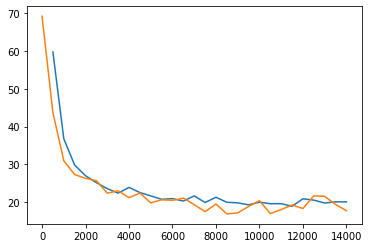

In [ ]:
import matplotlib.pyplot as plt

train_gen_spaced = np.zeros((len(train_gen), 2))
for i in range(len(train_gen)):
  train_gen_spaced[i,0] = (i+1)*500
  train_gen_spaced[i,1] = train_gen[i]

val_gen_spaced = np.zeros((len(val_gen), 2))
for i in range(len(val_gen)):
  val_gen_spaced[i,0] = i*500
  val_gen_spaced[i,1] = val_gen[i]

plt.plot(train_gen_spaced[:,0], train_gen_spaced[:,1])
plt.plot(val_gen_spaced[:,0], val_gen_spaced[:,1])

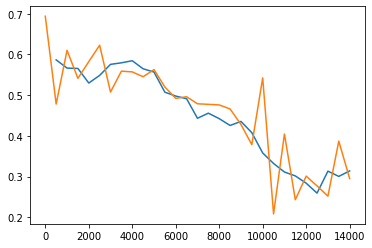

In [ ]:
train_disc_spaced = np.zeros((len(train_disc), 2))
for i in range(len(train_disc)):
  train_disc_spaced[i,0] = (i+1)*500
  train_disc_spaced[i,1] = train_disc[i]

val_disc_spaced = np.zeros((len(val_disc), 2))
for i in range(len(val_disc)):
  val_disc_spaced[i,0] = i*500
  val_disc_spaced[i,1] = val_disc[i]

plt.plot(train_disc_spaced[:,0], train_disc_spaced[:,1])
plt.plot(val_disc_spaced[:,0], val_disc_spaced[:,1])

Harro Everynyan How are you? Fine? Sank you. OHMY GAH

In [ ]:
gen.eval()

Generator(
  (upfeature): FeatureMapBlock(
    (conv): Conv2d(6, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (contract1): ContractingBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (activation): LeakyReLU(negative_slope=0.2)
    (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contract2): ContractingBlock(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (activation): LeakyReLU(negative_slope=0.2)
    (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batchnorm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contract3): Contract

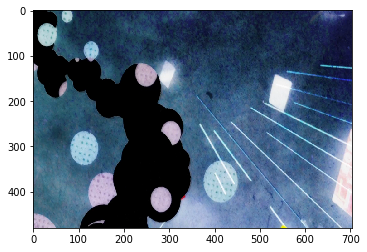

In [ ]:
folder = 'a'
image_index = 1
frame1 = np.array(Image.open('/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{image_index:05}')))/255
frame2 = np.array(Image.open('/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{image_index+1:05}')))/255
plt.imshow(frame1, interpolation='nearest')
plt.imshow(frame2, interpolation='nearest')

In [ ]:
loaded_state = torch.load("/content/gdrive/MyDrive/CS236G_Project/opgan_1000.pth")
gen.load_state_dict(loaded_state["gen"])

<All keys matched successfully>

In [ ]:
def synthesizeframe(frame1, frame2):
  frame1 = np.expand_dims(frame1, axis = 0)
  frame2 = np.expand_dims(frame2, axis = 0)
  ba = torch.FloatTensor(np.transpose(frame1, (0, 3, 1, 2)))
  aa = torch.FloatTensor(np.transpose(frame2, (0, 3, 1, 2)))
  test_input = torch.cat((ba, aa), dim=1).to(device)
  output = gen(test_input)
  show_tensor_images(ba, size=(3, 480, 704))
  show_tensor_images(output, size=(3, 480, 704))
  show_tensor_images(aa, size=(3, 480, 704))

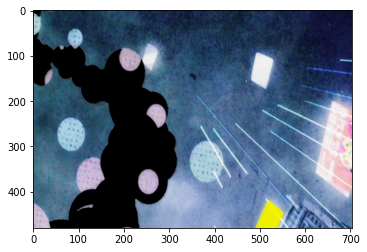

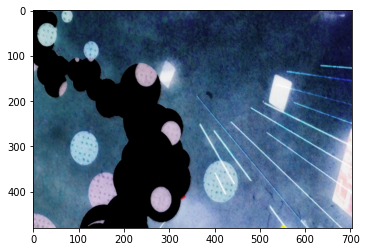

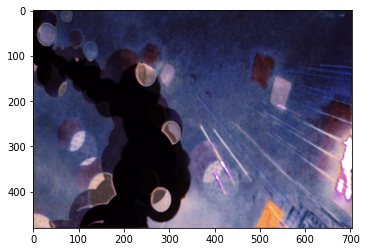

In [ ]:
synthesizeframe(frame1, frame2)

In [ ]:
def demo_interpolate(folder, image_index, frame_gap = 2,saveframe=False):
  frame1 = np.array(Image.open('/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{image_index:05}')))/255
  frame2 = np.array(Image.open('/content/gdrive/MyDrive/{}/{}/{}.png'.format(Frame_Storage, folder, f'{image_index+frame_gap:05}')))/255
  synthesizeframe(frame1, frame2)

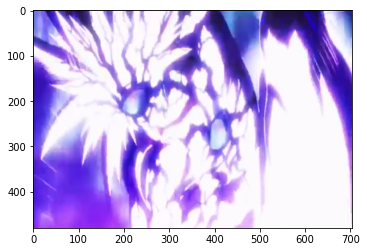

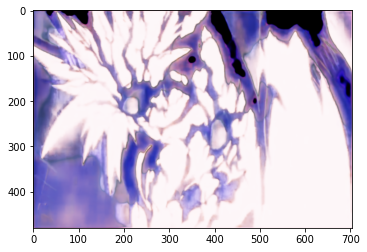

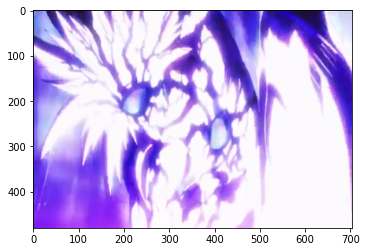

In [ ]:
demo_interpolate('c2', 236, frame_gap=1)

Construct the test set

In [3]:
%shell ffmpeg -i '/content/gdrive/MyDrive/CS236G_Project/clips/jojo.mkv' -vf 'select=gte(n\,1),setpts=PTS-STARTPTS,scale=704:480' '/content/gdrive/MyDrive/CS236G_Project/test_frames/jojo/%05d.png'

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [7]:
frame_gap = 1
import glob as glob
folders = ['jojo']

for folder in folders:
  frame_count = len(list(glob.iglob("/content/gdrive/MyDrive/{}/{}/*.png".format(Frame_Storage, folder))))
  todo = frame_count - 2*frame_gap
  print("Commencing on frame folder {}".format(folder))
  for i in range(1, todo+1):
    image2chunk(folder, i, frame_gap)
    if i%50 == 0:
      print("Processed {} out of {} on todo list".format(i, todo))
  print("Finished on frame folder {}".format(folder))

Commencing on frame folder jojo
Processed 50 out of 2107 on todo list
Processed 100 out of 2107 on todo list
Processed 150 out of 2107 on todo list
Processed 200 out of 2107 on todo list
Processed 250 out of 2107 on todo list
Processed 300 out of 2107 on todo list
Processed 350 out of 2107 on todo list
Processed 400 out of 2107 on todo list
Processed 450 out of 2107 on todo list
Processed 500 out of 2107 on todo list
Processed 550 out of 2107 on todo list
Processed 600 out of 2107 on todo list
Processed 650 out of 2107 on todo list
Processed 700 out of 2107 on todo list
Processed 750 out of 2107 on todo list
Processed 800 out of 2107 on todo list
Processed 850 out of 2107 on todo list
Processed 900 out of 2107 on todo list
Processed 950 out of 2107 on todo list
Processed 1000 out of 2107 on todo list
Processed 1050 out of 2107 on todo list
Processed 1100 out of 2107 on todo list
Processed 1150 out of 2107 on todo list
Processed 1200 out of 2107 on todo list
Processed 1250 out of 2107 o

In [23]:
test_dataset = torchvision.datasets.ImageFolder('/content/gdrive/MyDrive/{}'.format(Chunk_Storage), transform=transform)

In [25]:
def test_generator(test_count_limit = 300):
  test_count = 0
  test_mean_gen_loss = 0
  test_mean_disc_loss = 0
  test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
  for image, _ in tqdm(test_dataloader):
    image_width = image.shape[3]
    pre = image[:, :, :, :image_width // 3]
    post = image[:, :, :, image_width // 3:2*image_width // 3]
    condition = torch.cat((pre, post), dim=1)
    real = image[:, :, :, 2*image_width // 3:]

    cur_batch_size = len(condition)
    condition = condition.to(device)
    real = real.to(device)

    disc_opt.zero_grad() # Zero out the gradient before backpropagation
    with torch.no_grad():
        fake = gen(condition)
    disc_fake_hat = disc(fake.detach(), condition) # Detach generator
    disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
    disc_real_hat = disc(real, condition)
    disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2

    gen_opt.zero_grad()
    gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)

    test_mean_gen_loss += gen_loss.item() / test_count_limit
    test_mean_disc_loss += disc_loss.item() / test_count_limit

    if test_count % 10 == 0:
      show_tensor_images(real, size=(3, 480, 704))
      show_tensor_images(fake, size=(3, 480, 704))

    test_count += 1
    if test_count >= test_count_limit:
      break
  print("Test Set Gen Loss: {}, Test Set Disc Loss: {}".format(test_mean_gen_loss, test_mean_disc_loss))

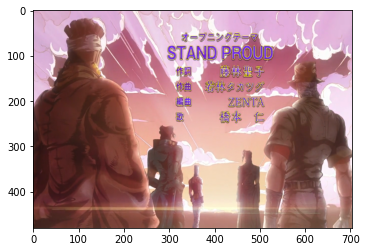

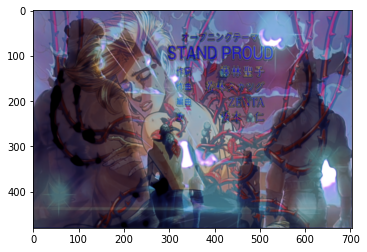

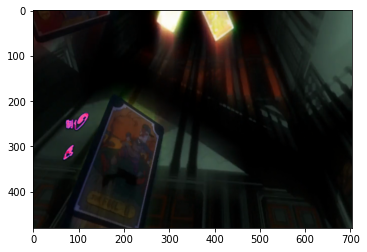

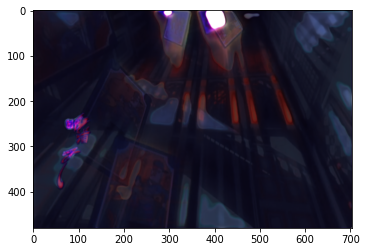

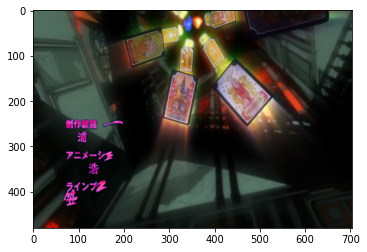

...

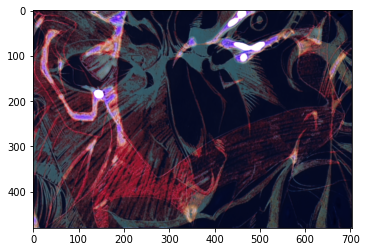

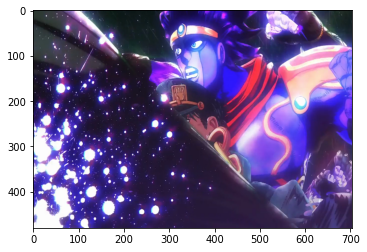

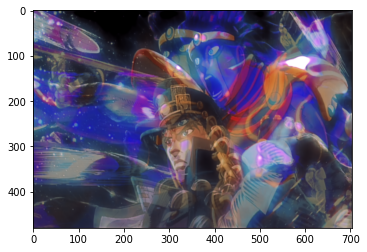

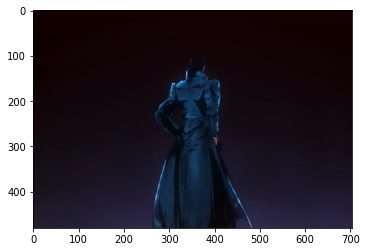

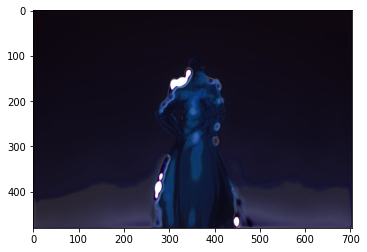

Test Set Gen Loss: 29.741948982874558, Test Set Disc Loss: 0.24341442765668045


In [26]:
test_generator()